In [1]:
import scanpy as sc
import pandas as pd
import matplotlib as mpl
import sys
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA


import sys

sys.path.append("../src")

/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/_utils/__init__.py:27: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/__init__.py:36: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/readwrite.py:15: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):


In [2]:
mpl.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['figure.dpi'] = 250
plt.rcParams['figure.figsize'] = (5, 5)
mpl.rcParams['font.family'] = 'sans-serif' 
mpl.rcParams['font.sans-serif'] = ['Arial']
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype']  = 42
mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['text.usetex'] = False
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Arial'
mpl.rcParams['mathtext.it'] = 'Arial:italic'
mpl.rcParams['mathtext.bf'] = 'Arial:bold'

In [3]:
from constants import time_points
from utils import average_pairwise_euclidean_similarity, bootstrap_confidence_interval, average_pairwise_cosine_similarity
from synchronicity import (
    compute_synchronicity,
    plot_synchronicity_row,
    compute_confidence_intervals,
    export_synchronicity_data
)

# UCE, no filtering

In [8]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read("../data/processed/acaA_pkaC.h5ad")


for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all[adata_acaA_pkaC_all.obs["time"] == tp]

/Users/lenatrnovec/scRNA_dicty/notebooks/../src/synchronicity.py:707: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=10)
/Users/lenatrnovec/scRNA_dicty/notebooks/../src/synchronicity.py:831: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=10)


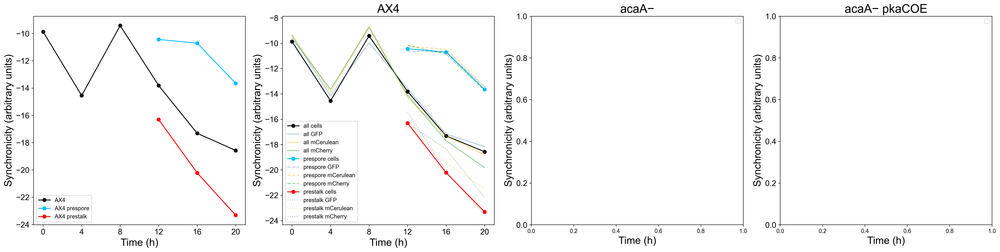

(<Figure size 6115.5x1564.25 with 4 Axes>,
 array([<Axes: xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA−'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA− pkaCOE'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>],
       dtype=object))

In [ ]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_uce",
    similarity_func=average_pairwise_euclidean_similarity,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
)

# UCE, filtering

In [4]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read("../data/processed/acaA_pkaC.h5ad")

adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
obs = adata_all_strains.obs

# good = all timepoints except the problematic ones
bad_mask  = (obs["strain"] == "acaA_pkaC") & obs["time"].isin(["04hr", "16hr"])
good_mask = ~bad_mask
print(good_mask.sum())
print(bad_mask.sum())

ref_counts = obs.loc[good_mask, "log1p_total_counts"]
ref_genes  = obs.loc[good_mask, "log1p_n_genes_by_counts"]

# choose how strict you want to be; 0.10–0.20 is common
q = 0.1
thr_counts = np.quantile(ref_counts, q)
thr_genes  = np.quantile(ref_genes, q)

print(f"Thresholds from good tps (q={q}): counts={thr_counts:.2f}, genes={thr_genes:.2f}")

# keep all good cells; in bad tps keep only cells above both thresholds
keep = good_mask | (
    bad_mask
    & (obs["log1p_total_counts"] >= thr_counts)
    & (obs["log1p_n_genes_by_counts"] >= thr_genes)
)

print(f"Keeping {keep.sum()} / {len(keep)} cells")

adata_acaA_pkaC_all_filt = adata_all_strains[keep].copy()
adata_acaA_pkaC_all_filt = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["strain"].isin(["acaA_pkaC"])]

for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all_filt[
        adata_acaA_pkaC_all_filt.obs["time"] == tp
    ]
    # if adatas_acaA_pkaC[tp].n_obs > 8000:
    #     idx = np.random.choice(adatas_acaA_pkaC[tp].n_obs, size=8000, replace=False)
    #     adatas_acaA_pkaC[tp] = adatas_acaA_pkaC[tp][idx].copy()

/var/folders/b0/d34rvffj6l18k2sl5mb16w440000gn/T/ipykernel_26993/2513405717.py:8: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)


335289
109648
Thresholds from good tps (q=0.1): counts=8.18, genes=7.11
Keeping 352297 / 444937 cells


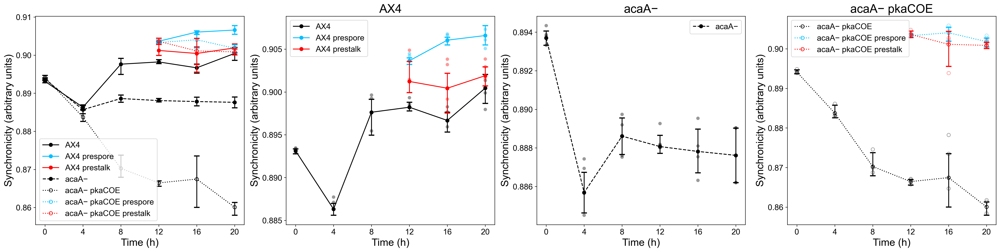

(<Figure size 6115.5x1564.25 with 4 Axes>,
 array([<Axes: xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA−'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA− pkaCOE'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>],
       dtype=object))

In [6]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_uce",
    similarity_func=average_pairwise_euclidean_similarity,
)
CI_dict = compute_confidence_intervals(
    results_pca['mean_distances'], 
    time_points,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
    CI_dict=CI_dict,
    save_path="../results/figures/acaA_pkaC/acaA_pkaC_sync_uce_2.pdf",
)

In [7]:
from scipy.stats import ttest_ind, mannwhitneyu
p_values_dict = {}
strains = ["AX4", "acaA", "acaA_pkaC"]
for h in range(3):
    if strains[h] not in p_values_dict:
        p_values_dict[strains[h]] = {}
    for j in range(h, 3):
        if strains[j] not in p_values_dict[strains[h]]:
            p_values_dict[strains[h]][strains[j]] = {}
        for k in range(0, len(time_points)):
            if time_points[k] not in p_values_dict[strains[h]][strains[j]]:
                p_values_dict[strains[h]][strains[j]][time_points[k]] = {}
            for l in range(k, len(time_points)):
                # Original groups
                replicates1 = [r for r in results_pca['mean_distances'][strains[h]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group1 = [results_pca['mean_distances'][strains[h]][r][time_points[k]] for r in replicates1]
                replicates2 = [r for r in results_pca['mean_distances'][strains[j]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group2 = [results_pca['mean_distances'][strains[j]][r][time_points[l]] for r in replicates2]
                t_stat, p_val_ttest = ttest_ind(group1, group2, equal_var=True)
                p_values_dict[strains[h]][strains[j]][time_points[k]][time_points[l]] = p_val_ttest
                print(f"{strains[h]} vs {strains[j]} at {time_points[k]} vs {time_points[l]}: {p_val_ttest:.10f}")
            print()

AX4 vs AX4 at 00hr vs 00hr: 1.0000000000
AX4 vs AX4 at 00hr vs 04hr: 0.0001450777
AX4 vs AX4 at 00hr vs 08hr: 0.0223916819
AX4 vs AX4 at 00hr vs 12hr: 0.0000961589
AX4 vs AX4 at 00hr vs 16hr: 0.0048521200
AX4 vs AX4 at 00hr vs 20hr: 0.0028951345

AX4 vs AX4 at 04hr vs 04hr: 1.0000000000
AX4 vs AX4 at 04hr vs 08hr: 0.0013733934
AX4 vs AX4 at 04hr vs 12hr: 0.0000201067
AX4 vs AX4 at 04hr vs 16hr: 0.0002187040
AX4 vs AX4 at 04hr vs 20hr: 0.0002830689

AX4 vs AX4 at 08hr vs 08hr: 1.0000000000
AX4 vs AX4 at 08hr vs 12hr: 0.6656924342
AX4 vs AX4 at 08hr vs 16hr: 0.6149368504
AX4 vs AX4 at 08hr vs 20hr: 0.3840212131

AX4 vs AX4 at 12hr vs 12hr: 1.0000000000
AX4 vs AX4 at 12hr vs 16hr: 0.1273326901
AX4 vs AX4 at 12hr vs 20hr: 0.3940612283

AX4 vs AX4 at 16hr vs 16hr: 1.0000000000
AX4 vs AX4 at 16hr vs 20hr: 0.1128928739

AX4 vs AX4 at 20hr vs 20hr: 1.0000000000

AX4 vs acaA at 00hr vs 00hr: 0.0929883225
AX4 vs acaA at 00hr vs 04hr: 0.0002892720
AX4 vs acaA at 00hr vs 08hr: 0.0009423066
AX4 vs 

In [8]:
# Create a multi-index DataFrame structure
index = pd.MultiIndex.from_product([strains, time_points], names=["Strain", "Time"])
columns = pd.MultiIndex.from_product([strains, time_points], names=["Comparison Strain", "Comparison Time"])

# Initialize an empty DataFrame
p_values_df = pd.DataFrame(index=index, columns=columns)

# Fill the DataFrame with p-values
for strain_1 in strains:
    for strain_2 in strains:
        for time_point1 in time_points:
            for time_point2 in time_points:
                p_value = p_values_dict.get(strain_1, {}).get(strain_2, {}).get(time_point1, {}).get(time_point2, np.nan)
                if p_value == 0:
                    formatted_p_value = "0.00"
                elif p_value < 0.01:
                    formatted_p_value = f"{p_value:.2e}"
                else:
                    formatted_p_value = f"{p_value:.2f}"
                p_values_df.loc[(strain_1, time_point1), (strain_2, time_point2)] = formatted_p_value

# Display the formatted DataFrame

In [9]:
p_values_df

Comparison Strain   AX4                                                    \
Comparison Time    00hr      04hr      08hr      12hr      16hr      20hr   
Strain    Time                                                              
AX4       00hr     1.00  1.45e-04      0.02  9.62e-05  4.85e-03  2.90e-03   
          04hr      nan      1.00  1.37e-03  2.01e-05  2.19e-04  2.83e-04   
          08hr      nan       nan      1.00      0.67      0.61      0.38   
          12hr      nan       nan       nan      1.00      0.13      0.39   
          16hr      nan       nan       nan       nan      1.00      0.11   
          20hr      nan       nan       nan       nan       nan      1.00   
acaA      00hr      nan       nan       nan       nan       nan       nan   
          04hr      nan       nan       nan       nan       nan       nan   
          08hr      nan       nan       nan       nan       nan       nan   
          12hr      nan       nan       nan       nan       nan       nan   
          16hr      nan       nan       nan       nan       nan       nan   
          20hr      nan       nan       nan       nan       nan       nan   
acaA_pkaC 00hr      nan       nan       nan       nan       nan       nan   
          04hr      nan       nan       nan       nan       nan       nan   
          08hr      nan       nan       nan       nan       nan       nan   
          12hr      nan       nan       nan       nan       nan       nan   
          16hr      nan       nan       nan       nan       nan       nan   
          20hr      nan       nan       nan       nan       nan       nan   

Comparison Strain  acaA                                                    \
Comparison Time    00hr      04hr      08hr      12hr      16hr      20hr   
Strain    Time                                                              
AX4       00hr     0.09  2.89e-04  9.42e-04  5.05e-05  1.14e-03  2.24e-03   
          04hr      nan      0.32      0.11      0.04      0.39      0.61   
          08hr      nan       nan  7.15e-04  4.14e-04  6.74e-04  8.58e-04   
          12hr      nan       nan       nan  2.28e-06  4.60e-05  1.02e-04   
          16hr      nan       nan       nan       nan  2.08e-04  3.56e-04   
          20hr      nan       nan       nan       nan       nan  2.14e-04   
acaA      00hr     1.00  3.11e-05  1.12e-04  5.20e-06  1.43e-04  3.20e-04   
          04hr      nan      1.00      0.03      0.02      0.11      0.21   
          08hr      nan       nan      1.00      0.85      0.49      0.40   
          12hr      nan       nan       nan      1.00      0.50      0.41   
          16hr      nan       nan       nan       nan      1.00      0.82   
          20hr      nan       nan       nan       nan       nan      1.00   
acaA_pkaC 00hr      nan       nan       nan       nan       nan       nan   
          04hr      nan       nan       nan       nan       nan       nan   
          08hr      nan       nan       nan       nan       nan       nan   
          12hr      nan       nan       nan       nan       nan       nan   
          16hr      nan       nan       nan       nan       nan       nan   
          20hr      nan       nan       nan       nan       nan       nan   

Comparison Strain acaA_pkaC                                                    
Comparison Time        00hr      04hr      08hr      12hr      16hr      20hr  
Strain    Time                                                                 
AX4       00hr         0.04  8.94e-04  2.45e-04  6.00e-07  5.99e-03  6.96e-06  
          04hr          nan      0.05  9.41e-04  4.25e-06      0.02  1.97e-05  
          08hr          nan       nan  2.65e-04  2.36e-05  3.41e-03  2.51e-05  
          12hr          nan       nan       nan  4.58e-07  2.58e-03  4.14e-06  
          16hr          nan       nan       nan       nan  3.33e-03  8.45e-06  
          20hr          nan       nan       nan       nan       nan  1.10e-05  
acaA      00hr         0.24  1.08e-04  2.34e

In [10]:
from scipy.stats import ttest_ind, mannwhitneyu
p_values_dict = {}
strains = ["AX4", "AX4_psp", "AX4_pst"]
for h in range(len(strains)):
    if strains[h] not in p_values_dict:
        p_values_dict[strains[h]] = {}
    for j in range(h, len(strains)):
        if strains[j] not in p_values_dict[strains[h]]:
            p_values_dict[strains[h]][strains[j]] = {}
        for k in range(3, len(time_points)):
            if time_points[k] not in p_values_dict[strains[h]][strains[j]]:
                p_values_dict[strains[h]][strains[j]][time_points[k]] = {}
            for l in range(k, len(time_points)):
                # Original groups
                replicates1 = [r for r in results_pca['mean_distances'][strains[h]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group1 = [results_pca['mean_distances'][strains[h]][r][time_points[k]] for r in replicates1]
                replicates2 = [r for r in results_pca['mean_distances'][strains[j]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group2 = [results_pca['mean_distances'][strains[j]][r][time_points[l]] for r in replicates2]
                t_stat, p_val_ttest = ttest_ind(group1, group2, equal_var=True)
                p_values_dict[strains[h]][strains[j]][time_points[k]][time_points[l]] = p_val_ttest
                print(f"{strains[h]} vs {strains[j]} at {time_points[k]} vs {time_points[l]}: {p_val_ttest:.10f}")
            print()

AX4 vs AX4 at 12hr vs 12hr: 1.0000000000
AX4 vs AX4 at 12hr vs 16hr: 0.1273326901
AX4 vs AX4 at 12hr vs 20hr: 0.3940612283

AX4 vs AX4 at 16hr vs 16hr: 1.0000000000
AX4 vs AX4 at 16hr vs 20hr: 0.1128928739

AX4 vs AX4 at 20hr vs 20hr: 1.0000000000

AX4 vs AX4_psp at 12hr vs 12hr: 0.0001440534
AX4 vs AX4_psp at 12hr vs 16hr: 0.0000485628
AX4 vs AX4_psp at 12hr vs 20hr: 0.0004964139

AX4 vs AX4_psp at 16hr vs 16hr: 0.0002600346
AX4 vs AX4_psp at 16hr vs 20hr: 0.0007423874

AX4 vs AX4_psp at 20hr vs 20hr: 0.0055301628

AX4 vs AX4_pst at 12hr vs 12hr: 0.0359794869
AX4 vs AX4_pst at 12hr vs 16hr: 0.0899634427
AX4 vs AX4_pst at 12hr vs 20hr: 0.0046914069

AX4 vs AX4_pst at 16hr vs 16hr: 0.0417739482
AX4 vs AX4_pst at 16hr vs 20hr: 0.0043569498

AX4 vs AX4_pst at 20hr vs 20hr: 0.0592061324

AX4_psp vs AX4_psp at 12hr vs 12hr: 1.0000000000
AX4_psp vs AX4_psp at 12hr vs 16hr: 0.0030306442
AX4_psp vs AX4_psp at 12hr vs 20hr: 0.0422812002

AX4_psp vs AX4_psp at 16hr vs 16hr: 1.0000000000
AX4_psp 

In [11]:
# Create a multi-index DataFrame structure
index = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Strain", "Time"])
columns = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Comparison Strain", "Comparison Time"])

# Initialize an empty DataFrame
p_values_df = pd.DataFrame(index=index, columns=columns)

# Fill the DataFrame with p-values
for strain_1 in strains:
    for strain_2 in strains:
        for time_point1 in time_points[3:]:
            for time_point2 in time_points[3:]:
                p_value = p_values_dict.get(strain_1, {}).get(strain_2, {}).get(time_point1, {}).get(time_point2, np.nan)
                if p_value == 0:
                    formatted_p_value = "0.00"
                elif p_value < 0.01:
                    formatted_p_value = f"{p_value:.2e}"
                else:
                    formatted_p_value = f"{p_value:.2f}"
                p_values_df.loc[(strain_1, time_point1), (strain_2, time_point2)] = formatted_p_value

# Display the formatted DataFrame

In [12]:
p_values_df

Comparison Strain   AX4               AX4_psp                     AX4_pst  \
Comparison Time    12hr  16hr  20hr      12hr      16hr      20hr    12hr   
Strain  Time                                                                
AX4     12hr       1.00  0.13  0.39  1.44e-04  4.86e-05  4.96e-04    0.04   
        16hr        nan  1.00  0.11       nan  2.60e-04  7.42e-04     nan   
        20hr        nan   nan  1.00       nan       nan  5.53e-03     nan   
AX4_psp 12hr        nan   nan   nan      1.00  3.03e-03      0.04    0.25   
        16hr        nan   nan   nan       nan      1.00      0.71     nan   
        20hr        nan   nan   nan       nan       nan      1.00     nan   
AX4_pst 12hr        nan   nan   nan       nan       nan       nan    1.00   
        16hr        nan   nan   nan       nan       nan       nan     nan   
        20hr        nan   nan   nan       nan       nan       nan     nan   

Comparison Strain                  
Comparison Time    16hr      20hr  
Strain  Time                       
AX4     12hr       0.09  4.69e-03  
        16hr       0.04  4.36e-03  
        20hr        nan      0.06  
AX4_psp 12hr       0.24      0.13  
        16hr       0.04  6.66e-03  
        20hr        nan      0.02  
AX4_pst 12hr       0.82      0.84  
        16hr       1.00      0.67  
        20hr        nan      1.00

In [13]:
from scipy.stats import ttest_ind, mannwhitneyu
p_values_dict = {}
strains = ["acaA_pkaC", "acaA_pkaC_psp", "acaA_pkaC_pst"]
for h in range(len(strains)):
    if strains[h] not in p_values_dict:
        p_values_dict[strains[h]] = {}
    for j in range(h, len(strains)):
        if strains[j] not in p_values_dict[strains[h]]:
            p_values_dict[strains[h]][strains[j]] = {}
        for k in range(3, len(time_points)):
            if time_points[k] not in p_values_dict[strains[h]][strains[j]]:
                p_values_dict[strains[h]][strains[j]][time_points[k]] = {}
            for l in range(k, len(time_points)):
                # Original groups
                replicates1 = [r for r in results_pca['mean_distances'][strains[h]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group1 = [results_pca['mean_distances'][strains[h]][r][time_points[k]] for r in replicates1]
                replicates2 = [r for r in results_pca['mean_distances'][strains[j]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group2 = [results_pca['mean_distances'][strains[j]][r][time_points[l]] for r in replicates2]
                t_stat, p_val_ttest = ttest_ind(group1, group2, equal_var=True)
                p_values_dict[strains[h]][strains[j]][time_points[k]][time_points[l]] = p_val_ttest
                print(f"{strains[h]} vs {strains[j]} at {time_points[k]} vs {time_points[l]}: {p_val_ttest:.10f}")
            print()

acaA_pkaC vs acaA_pkaC at 12hr vs 12hr: 1.0000000000
acaA_pkaC vs acaA_pkaC at 12hr vs 16hr: 0.2374869247
acaA_pkaC vs acaA_pkaC at 12hr vs 20hr: 0.0060230227

acaA_pkaC vs acaA_pkaC at 16hr vs 16hr: 1.0000000000
acaA_pkaC vs acaA_pkaC at 16hr vs 20hr: 0.0469232908

acaA_pkaC vs acaA_pkaC at 20hr vs 20hr: 1.0000000000

acaA_pkaC vs acaA_pkaC_psp at 12hr vs 12hr: 0.0000001902
acaA_pkaC vs acaA_pkaC_psp at 12hr vs 16hr: 0.0000055219
acaA_pkaC vs acaA_pkaC_psp at 12hr vs 20hr: 0.0000015041

acaA_pkaC vs acaA_pkaC_psp at 16hr vs 16hr: 0.0014126360
acaA_pkaC vs acaA_pkaC_psp at 16hr vs 20hr: 0.0016537282

acaA_pkaC vs acaA_pkaC_psp at 20hr vs 20hr: 0.0000048001

acaA_pkaC vs acaA_pkaC_pst at 12hr vs 12hr: 0.0000005449
acaA_pkaC vs acaA_pkaC_pst at 12hr vs 16hr: 0.0003157588
acaA_pkaC vs acaA_pkaC_pst at 12hr vs 20hr: 0.0000006335

acaA_pkaC vs acaA_pkaC_pst at 16hr vs 16hr: 0.0048955180
acaA_pkaC vs acaA_pkaC_pst at 16hr vs 20hr: 0.0018271625

acaA_pkaC vs acaA_pkaC_pst at 20hr vs 20hr: 0.0

In [14]:
# Create a multi-index DataFrame structure
index = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Strain", "Time"])
columns = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Comparison Strain", "Comparison Time"])

# Initialize an empty DataFrame
p_values_df = pd.DataFrame(index=index, columns=columns)

# Fill the DataFrame with p-values
for strain_1 in strains:
    for strain_2 in strains:
        for time_point1 in time_points[3:]:
            for time_point2 in time_points[3:]:
                p_value = p_values_dict.get(strain_1, {}).get(strain_2, {}).get(time_point1, {}).get(time_point2, np.nan)
                if p_value == 0:
                    formatted_p_value = "0.00"
                elif p_value < 0.01:
                    formatted_p_value = f"{p_value:.2e}"
                else:
                    formatted_p_value = f"{p_value:.2f}"
                p_values_df.loc[(strain_1, time_point1), (strain_2, time_point2)] = formatted_p_value

# Display the formatted DataFrame

In [15]:
p_values_df

Comparison Strain  acaA_pkaC                 acaA_pkaC_psp            \
Comparison Time         12hr  16hr      20hr          12hr      16hr   
Strain        Time                                                     
acaA_pkaC     12hr      1.00  0.24  6.02e-03      1.90e-07  5.52e-06   
              16hr       nan  1.00      0.05           nan  1.41e-03   
              20hr       nan   nan      1.00           nan       nan   
acaA_pkaC_psp 12hr       nan   nan       nan          1.00      0.47   
              16hr       nan   nan       nan           nan      1.00   
              20hr       nan   nan       nan           nan       nan   
acaA_pkaC_pst 12hr       nan   nan       nan           nan       nan   
              16hr       nan   nan       nan           nan       nan   
              20hr       nan   nan       nan           nan       nan   

Comparison Strain            acaA_pkaC_pst                      
Comparison Time         20hr          12hr      16hr      20hr  
Strain        Time                                              
acaA_pkaC     12hr  1.50e-06      5.45e-07  3.16e-04  6.34e-07  
              16hr  1.65e-03           nan  4.90e-03  1.83e-03  
              20hr  4.80e-06           nan       nan  3.76e-06  
acaA_pkaC_psp 12hr      0.19          0.51      0.22      0.01  
              16hr      0.19           nan      0.17      0.06  
              20hr      1.00           nan       nan      0.28  
acaA_pkaC_pst 12hr       nan          1.00      0.19      0.02  
              16hr       nan           nan      1.00      0.52  
              20hr       nan           nan       nan      1.00

In [6]:
dfs = export_synchronicity_data(
    results_pca,
    CI_dict=CI_dict,
    save_path="../results/synchronicity_source_data.xlsx"
)

Data exported to ../results/synchronicity_source_data.xlsx
Sheets: ['synchronicity', 'synchronicity_confidence_intervals']


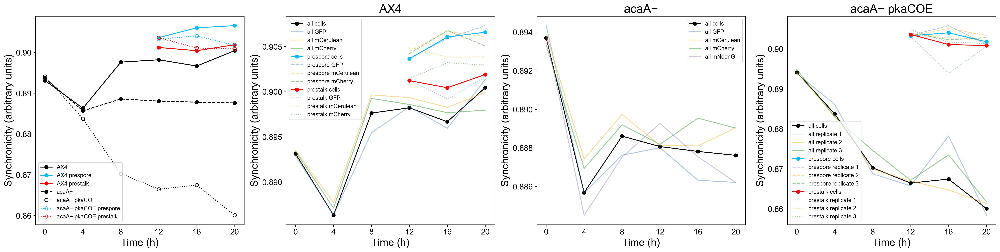

(<Figure size 6115.5x1564.25 with 4 Axes>,
 array([<Axes: xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA−'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA− pkaCOE'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>],
       dtype=object))

In [7]:
plot_synchronicity_row(
    results_pca['mean_distances'],
    save_path="../results/figures/acaA_pkaC/acaA_pkaC_sync_uce_3.pdf",
)

In [8]:
#save results_pca to file
import pickle
with open("../results/synchronicity_source_data.pkl", "wb") as f:
    pickle.dump(results_pca, f)
with open("../results/synchronicity_CI_dict.pkl", "wb") as f:
    pickle.dump(CI_dict, f)


# Re-plot synchronicity graphs

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import umap
import seaborn as sns
import warnings
import matplotlib.image as mpimg
from matplotlib.colors import LinearSegmentedColormap
import sys
import gc
from pympler import asizeof
from matplotlib.patches import Rectangle

import sys

sys.path.append("../src")

warnings.filterwarnings("ignore")
sc.settings.verbosity = 0
# set the default figure size and resolution
mpl.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (5, 5)
mpl.rcParams['font.family'] = 'sans-serif' 
mpl.rcParams['font.sans-serif'] = ['Helvetica']
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype']  = 42
mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['text.usetex'] = False
from constants import replicate_palette, palette, time_points

In [ ]:
umap_adata_acaA_pkaC = umap.UMAP(random_state=42)
umap_adata_acaA_pkaC.fit(adata_acaA_pkaC_all_filt.obsm["X_uce"]) 
adata_acaA_pkaC_all_filt.obsm["X_uce_umap"] = umap_adata_acaA_pkaC.transform(adata_acaA_pkaC_all_filt.obsm["X_uce"])

In [ ]:
umap_adata_new = umap.UMAP(random_state=42)
umap_adata_new.fit(adata_all.obsm["X_uce"])

UMAP(n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [ ]:
adata_acaA_pkaC_all_filt.obsm["X_uce_umap_AX4"] = umap_adata_new.transform(adata_acaA_pkaC_all_filt.obsm["X_uce"])

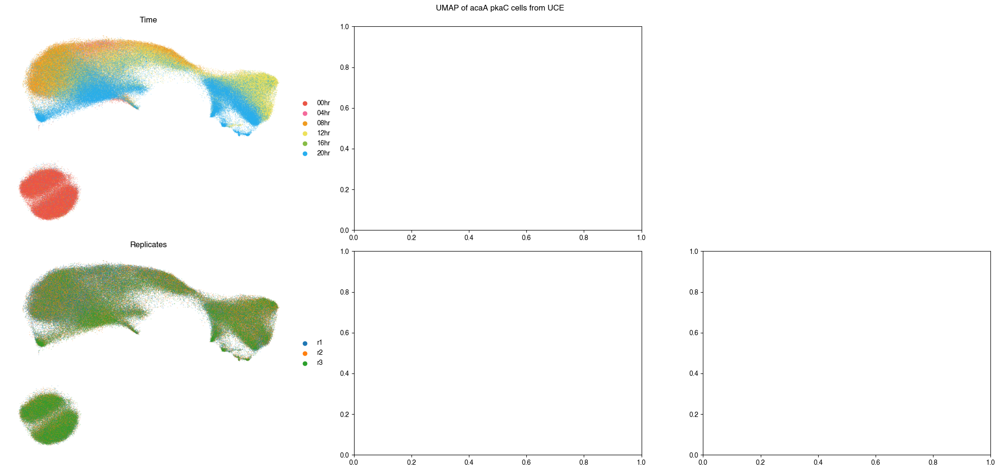

In [ ]:
rows, cols = 2, 3
fig, ax = plt.subplots(rows, cols, figsize=(21, 10))

for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        a = subplot
        rect = Rectangle(
            (0, 0),
            1,
            1,
            transform=a.transAxes,
            zorder=0,
            facecolor="white"
        )
        a.add_patch(rect)

sc.pl.embedding(
    adata_acaA_pkaC_all_filt,
    basis='X_uce_umap',
    color='time',
    size=5,
    alpha=0.3,
    palette=palette,
    frameon=False,
    ax=ax[0][0],
    show=False,
    title="Time",
)

sc.pl.embedding(
    adata_acaA_pkaC_all_filt,
    basis='X_uce_umap',
    color='marker',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[1][0],
    show=False,
    title="Replicates",
)


ax[0][2].axis('off')

for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        for coll in subplot.collections:
            coll.set_rasterized(True)

plt.suptitle("UMAP of acaA pkaC cells from UCE")
plt.tight_layout()
plt.savefig("../results/figures/acaA_pkaC/acaA_pkaC_filt.pdf", dpi=1200, backend="pgf")
plt.show()


In [ ]:
adata_acaA_pkaC_new_00hr = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["time"] == "00hr"]
adata_acaA_pkaC_new_04hr = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["time"] == "04hr"]
adata_acaA_pkaC_new_08hr = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["time"] == "08hr"]
adata_acaA_pkaC_new_12hr = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["time"] == "12hr"]
adata_acaA_pkaC_new_16hr = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["time"] == "16hr"]
adata_acaA_pkaC_new_20hr = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["time"] == "20hr"]

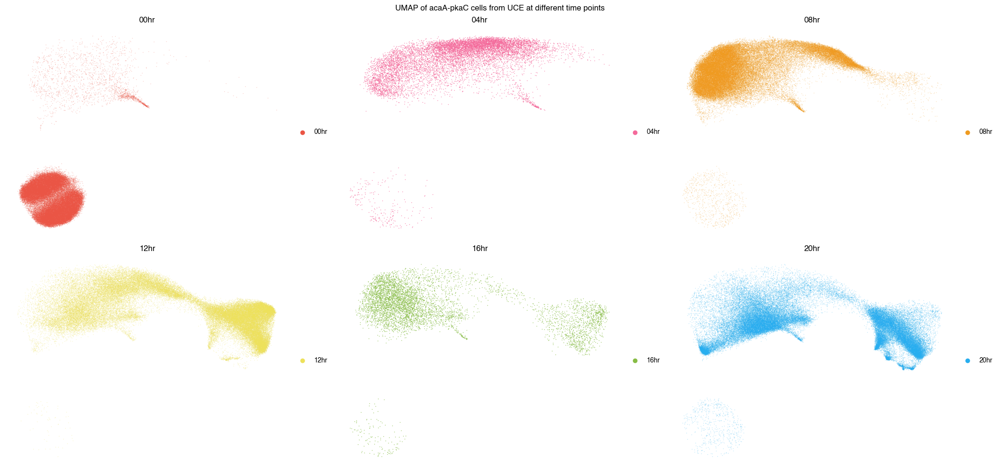

In [ ]:
rows, cols = 2, 3

fig, ax = plt.subplots(rows, cols, figsize=(21, 10))

for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        a = subplot
        rect = Rectangle(
            (0, 0),
            1,
            1,
            transform=a.transAxes,
            zorder=0,
            facecolor="white"
        )
        a.add_patch(rect)

sc.pl.embedding(
    adata_acaA_pkaC_new_00hr,
    basis='X_uce_umap',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[0][0],
    show=False,
    title="00hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_04hr,
    basis='X_uce_umap',
    color='time',
    size=5,
    alpha=0.8,
    frameon=False,
    ax=ax[0][1],
    show=False,
    title="04hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_08hr,
    basis='X_uce_umap',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[0][2],
    show=False,
    title="08hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_12hr,
    basis='X_uce_umap',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[1][0],
    show=False,
    title="12hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_16hr,
    basis='X_uce_umap',
    color='time',
    size=5,
    alpha=0.8,
    frameon=False,
    ax=ax[1][1],
    show=False,
    title="16hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_20hr,
    basis='X_uce_umap',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[1][2],
    show=False,
    title="20hr",
)

for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        for coll in subplot.collections:
            coll.set_rasterized(True)

plt.suptitle("UMAP of acaA-pkaC cells from UCE at different time points")
plt.tight_layout()
plt.savefig("../results/figures/acaA_pkaC/acaA_pkaC_time_filt.pdf", dpi=1200, backend="pgf")
plt.show()

In [ ]:
adata_acaA_pkaC_new_r1 = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["marker"] == "r1"]
adata_acaA_pkaC_new_r2 = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["marker"] == "r2"]
adata_acaA_pkaC_new_r3 = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["marker"] == "r3"]

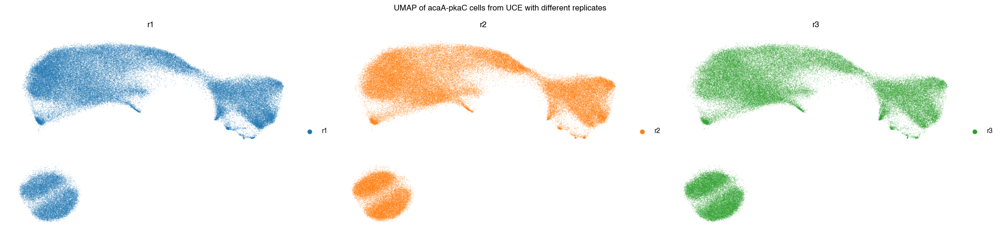

In [ ]:
rows, cols = 1, 3

fig, ax = plt.subplots(rows, cols, figsize=(21, 5))

sc.pl.embedding(
    adata_acaA_pkaC_new_r1,
    basis='X_uce_umap',
    color='marker',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[0],
    show=False,
    title="r1",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_r2,
    basis='X_uce_umap',
    color='marker',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[1],
    show=False,
    title="r2",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_r3,
    basis='X_uce_umap',
    color='marker',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[2],
    show=False,
    title="r3",
)

for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        for coll in subplot.collections:
            coll.set_rasterized(True)

plt.suptitle("UMAP of acaA-pkaC cells from UCE with different replicates")
plt.tight_layout()
plt.savefig("../results/figures/acaA_pkaC/acaA_pkaC_replicates_filt.pdf", dpi=1200, backend="pgf")
plt.show()


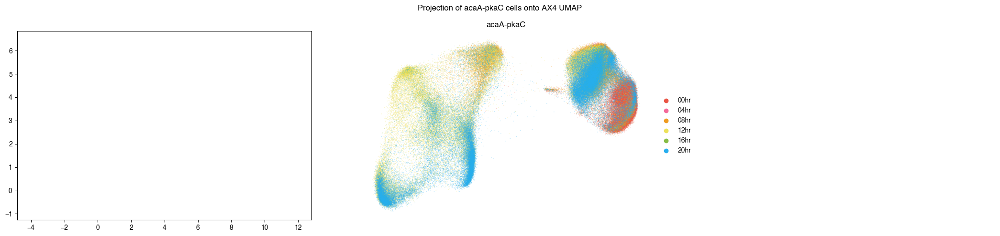

In [ ]:
rows, cols = 1, 3

fig, ax = plt.subplots(rows, cols, figsize=(21, 5))

for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        a = subplot
        rect = Rectangle(
            (0, 0),
            1,
            1,
            transform=a.transAxes,
            zorder=0,
            facecolor="white"
        )
        a.add_patch(rect)

sc.pl.embedding(
    adata_acaA_pkaC_all_filt,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    palette=palette,
    alpha=0.3,
    frameon=False,
    ax=ax[1],
    show=False,
    title="acaA-pkaC",
)
ax[2].axis('off')

# Get the x and y limits from all subplots
xlims = []
ylims = []
for i in range(2):
    xlims.append(ax[i].get_xlim())
    ylims.append(ax[i].get_ylim())

# Find the common limits
x_min, x_max = min([x[0] for x in xlims]), max([x[1] for x in xlims])
y_min, y_max = min([y[0] for y in ylims]), max([y[1] for y in ylims])

# Set the common limits for all subplots
for i in range(2):
    ax[i].set_xlim(x_min, x_max)
    ax[i].set_ylim(y_min, y_max)
    
for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        for coll in subplot.collections:
            coll.set_rasterized(True)

plt.suptitle("Projection of acaA-pkaC cells onto AX4 UMAP")
plt.tight_layout()
plt.savefig("../results/figures/acaA_pkaC/acaA_pkaC_ontoAX4_filt.pdf", dpi=1200, backend="pgf")
plt.show()


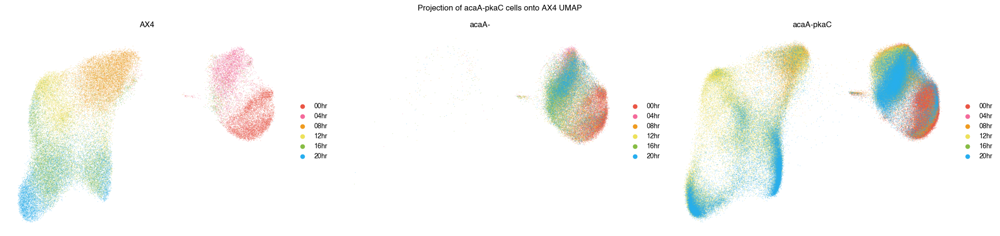

In [ ]:
rows, cols = 1, 3

fig, ax = plt.subplots(rows, cols, figsize=(21, 5))

for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        a = subplot
        rect = Rectangle(
            (0, 0),
            1,
            1,
            transform=a.transAxes,
            zorder=0,
            facecolor="white"
        )
        a.add_patch(rect)

sc.pl.embedding(
    adata_all,
    basis='X_uce_umap',
    color='time',
    size=5,
    palette=palette,
    alpha=0.3,
    frameon=False,
    ax=ax[0],
    show=False,
    title="AX4",
)

sc.pl.embedding(
    adata_acaA_all,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    palette=palette,
    alpha=0.3,
    frameon=False,
    ax=ax[1],
    show=False,
    title="acaA-",
)
ax[2].axis('off')

sc.pl.embedding(
    adata_acaA_pkaC_all_filt,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    palette=palette,
    alpha=0.3,
    frameon=False,
    ax=ax[2],
    show=False,
    title="acaA-pkaC",
)

# Get the x and y limits from all subplots
xlims = []
ylims = []
for i in range(2):
    xlims.append(ax[i].get_xlim())
    ylims.append(ax[i].get_ylim())

# Find the common limits
x_min, x_max = min([x[0] for x in xlims]), max([x[1] for x in xlims])
y_min, y_max = min([y[0] for y in ylims]), max([y[1] for y in ylims])

# Set the common limits for all subplots
for i in range(2):
    ax[i].set_xlim(x_min, x_max)
    ax[i].set_ylim(y_min, y_max)
    
for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        for coll in subplot.collections:
            coll.set_rasterized(True)

plt.suptitle("Projection of acaA-pkaC cells onto AX4 UMAP")
plt.tight_layout()
plt.savefig("../results/figures/acaA/temp1.pdf", dpi=1200, backend="pgf")
plt.show()


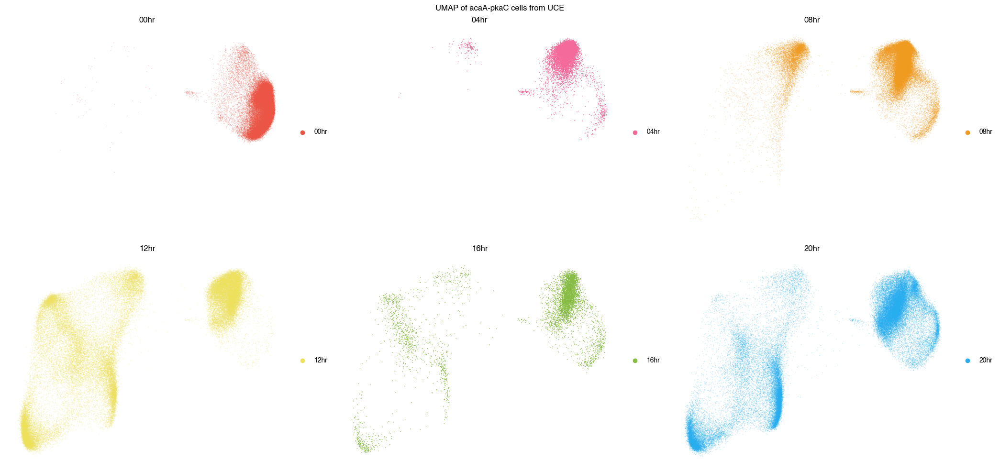

In [ ]:
rows, cols = 2, 3

fig, ax = plt.subplots(rows, cols, figsize=(21, 10))

# add a white rectangle to each subplot
for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        a = subplot
        rect = Rectangle(
            (0, 0),
            1,
            1,
            transform=a.transAxes,
            zorder=0,
            facecolor="white"
        )
        a.add_patch(rect)

# Plot each embedding
sc.pl.embedding(
    adata_acaA_pkaC_new_00hr,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[0][0],
    show=False,
    title="00hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_04hr,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    alpha=1,
    frameon=False,
    ax=ax[0][1],
    show=False,
    title="04hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_08hr,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[0][2],
    show=False,
    title="08hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_12hr,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[1][0],
    show=False,
    title="12hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_16hr,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    alpha=1,
    frameon=False,
    ax=ax[1][1],
    show=False,
    title="16hr",
)
sc.pl.embedding(
    adata_acaA_pkaC_new_20hr,
    basis='X_uce_umap_AX4',
    color='time',
    size=5,
    alpha=0.3,
    frameon=False,
    ax=ax[1][2],
    show=False,
    title="20hr",
)

# Get the x and y limits from all subplots
xlims = []
ylims = []
for i in range(2):
    for j in range(3):
        xlims.append(ax[i][j].get_xlim())
        ylims.append(ax[i][j].get_ylim())

# Find the common limits
x_min, x_max = min([x[0] for x in xlims]), max([x[1] for x in xlims])
y_min, y_max = min([y[0] for y in ylims]), max([y[1] for y in ylims])

# Set the common limits for all subplots
for i in range(2):
    for j in range(3):
        ax[i][j].set_xlim(x_min, x_max)
        ax[i][j].set_ylim(y_min, y_max)
        
for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        for coll in subplot.collections:
            coll.set_rasterized(True)

# Add title and adjust layout
plt.suptitle("UMAP of acaA-pkaC cells from UCE")
plt.tight_layout()
plt.savefig("../results/figures/acaA_pkaC/acaA_pkaC_time_ontoAX4_filt.pdf", dpi=1200, backend="pgf")
plt.show()

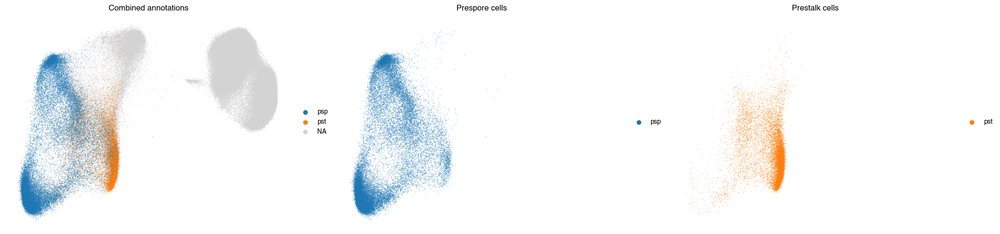

In [ ]:
rows, cols = 1, 3

fig, ax = plt.subplots(rows, cols, figsize=(21, 5))

# add a white rectangle to each subplot
for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        a = subplot
        rect = Rectangle(
            (0, 0),
            1,
            1,
            transform=a.transAxes,
            zorder=0,
            facecolor="white"
        )
        a.add_patch(rect)
        
sc.pl.embedding(
    adata_acaA_pkaC_all_filt,
    basis='X_uce_umap_AX4',
    color='cell_type',
    size=5,
    alpha=0.5,
    frameon=False,
    ax=ax[0],
    show=False,
    title="Combined annotations",
)
adata_acaA_pkaC_new_psp = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["cell_type"] == "psp"].copy()
sc.pl.embedding(
    adata_acaA_pkaC_new_psp,
    basis='X_uce_umap_AX4',
    color='cell_type',
    size=5,
    alpha=0.5,
    frameon=False,
    ax=ax[1],
    show=False,
    title="Prespore cells",
)
adata_acaA_pkaC_new_pst = adata_acaA_pkaC_all_filt[adata_acaA_pkaC_all_filt.obs["cell_type"] == "pst"].copy()
sc.pl.embedding(
    adata_acaA_pkaC_new_pst,
    basis='X_uce_umap_AX4',
    color='cell_type',
    size=5,
    alpha=0.5,
    frameon=False,
    ax=ax[2],
    show=False,
    title="Prestalk cells",
)

# Get the x and y limits from all subplots
xlims = []
ylims = []
for i in range(3):
    xlims.append(ax[i].get_xlim())
    ylims.append(ax[i].get_ylim())

# Find the common limits
x_min, x_max = min([x[0] for x in xlims]), max([x[1] for x in xlims])
y_min, y_max = min([y[0] for y in ylims]), max([y[1] for y in ylims])

# Set the common limits for all subplots
for i in range(3):
    ax[i].set_xlim(x_min, x_max)
    ax[i].set_ylim(y_min, y_max)
    
for i in range(rows):
    for j in range(cols):
        if rows > 1:
            subplot = ax[i][j]
        else:
            subplot = ax[j]
        for coll in subplot.collections:
            coll.set_rasterized(True)
    
    
plt.tight_layout()
plt.savefig("../results/figures/acaA_pkaC/acaA_pkaC_cell_types_filt.pdf", dpi=1200, backend="pgf")
plt.show()

# Other

In [ ]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read("../data/processed/acaA_pkaC.h5ad")

In [ ]:
adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)

adata_all_strains.obs["sample"] = (
    adata_all_strains.obs["strain"].astype(str)
    + "_"
    + adata_all_strains.obs["time"].astype(str)
)

/var/folders/b0/d34rvffj6l18k2sl5mb16w440000gn/T/ipykernel_77351/414709192.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)


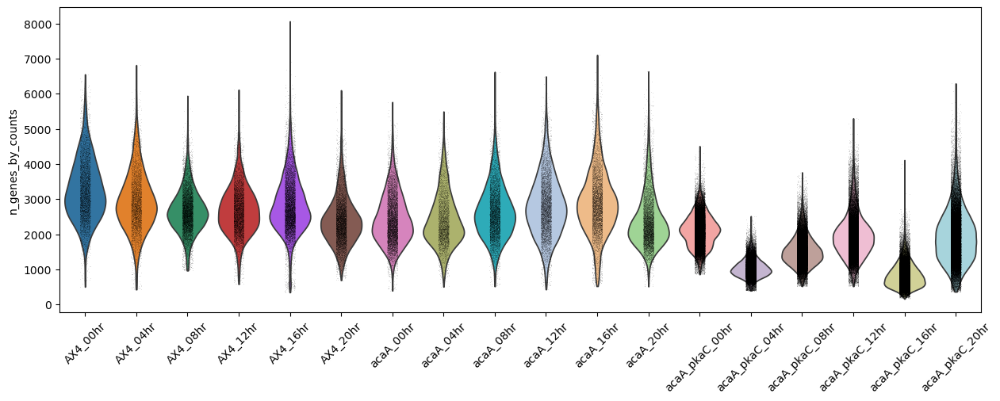

In [ ]:
fig, ax = plt.subplots(figsize=(15, 5))
sc.pl.violin(
    adata_all_strains,
    keys="n_genes_by_counts",
    groupby="sample",
    rotation=45,        # rotate x tick labels if needed
    multi_panel=False,
    ax=ax,
    show=False,
    size=0.2
)
# ax.set_ylim(0, 50000)
plt.show()

In [ ]:
adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all_filt)
adata_all_strains.obs["sample"] = (
    adata_all_strains.obs["strain"].astype(str)
    + "_"
    + adata_all_strains.obs["time"].astype(str)
)

/var/folders/b0/d34rvffj6l18k2sl5mb16w440000gn/T/ipykernel_77351/1649428102.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all_filt)


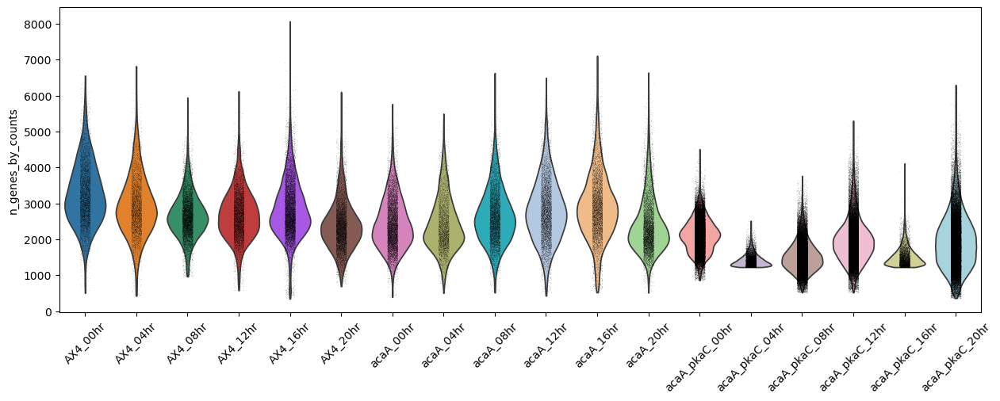

In [ ]:
fig, ax = plt.subplots(figsize=(15, 5))
sc.pl.violin(
    adata_all_strains,
    keys="n_genes_by_counts",
    groupby="sample",
    rotation=45,        # rotate x tick labels if needed
    multi_panel=False,
    ax=ax,
    show=False,
    size=0.2
)
plt.show()

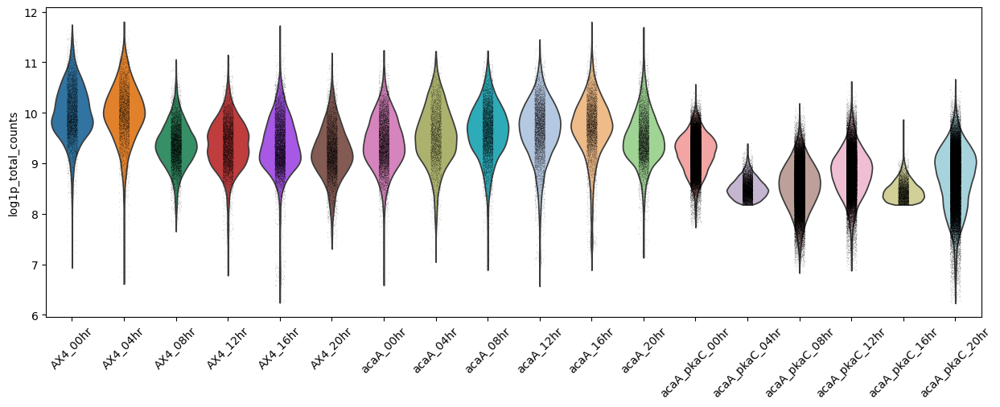

In [ ]:
fig, ax = plt.subplots(figsize=(15, 5))
sc.pl.violin(
    adata_all_strains,
    keys="log1p_total_counts",
    groupby="sample",
    rotation=45,        # rotate x tick labels if needed
    multi_panel=False,
    ax=ax,
    show=False,
    size=0.2
)
plt.show()

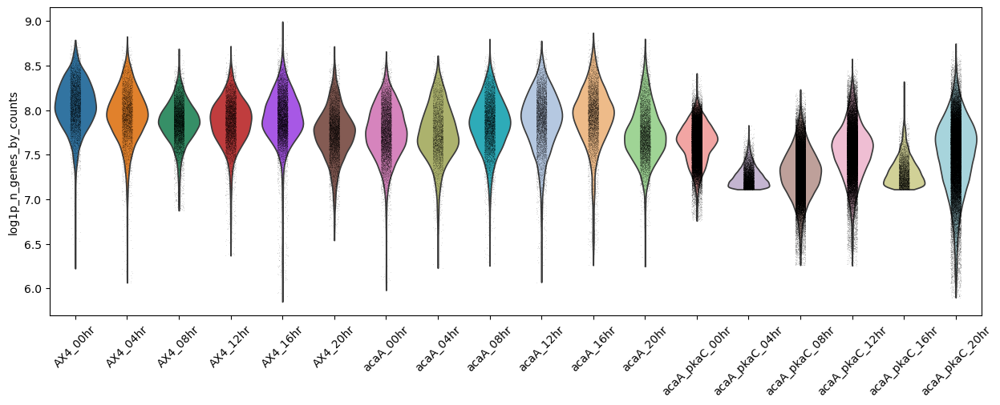

In [ ]:
fig, ax = plt.subplots(figsize=(15, 5))
sc.pl.violin(
    adata_all_strains,
    keys="log1p_n_genes_by_counts",
    groupby="sample",
    rotation=45,        # rotate x tick labels if needed
    multi_panel=False,
    ax=ax,
    show=False,
    size=0.2
)
plt.show()

# PCA on each strain, cosine distances, no preprocessing, 50 components

In [ ]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read(filename=f"../data/processed/acaA_pkaC.h5ad")

np.random.seed(42)
idx = np.random.choice(adata_acaA_pkaC_all.X.shape[0], size=int(adata_acaA_pkaC_all.X.shape[0] * 0.1), replace=False)
adata_acaA_pkaC_all = adata_acaA_pkaC_all[idx].copy()


adata_all.obsm["X_pca"] = PCA(
    n_components=50,
    random_state=42,
).fit_transform(adata_all.X)
adata_acaA_all.obsm["X_pca"] = PCA(
    n_components=50,
    random_state=42,
).fit_transform(adata_acaA_all.X)
adata_acaA_pkaC_all.obsm["X_pca"] = PCA(
    n_components=50,
    random_state=42,
).fit_transform(adata_acaA_pkaC_all.X)
for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all[adata_acaA_pkaC_all.obs["time"] == tp]

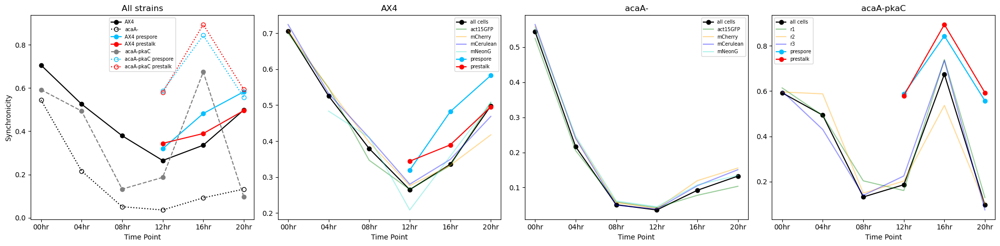

(<Figure size 2000x500 with 4 Axes>,
 array([<Axes: title={'center': 'All strains'}, xlabel='Time Point', ylabel='Synchronicity'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-pkaC'}, xlabel='Time Point'>],
       dtype=object))

In [ ]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_pca",
    similarity_func=average_pairwise_cosine_similarity,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
)

# PCA on each strain, cosine distances, some preprocessing, 50 components

In [ ]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read(filename=f"../data/processed/acaA_pkaC.h5ad")

np.random.seed(42)
idx = np.random.choice(adata_acaA_pkaC_all.X.shape[0], size=int(adata_acaA_pkaC_all.X.shape[0] * 0.1), replace=False)
adata_acaA_pkaC_all = adata_acaA_pkaC_all[idx].copy()

sc.pp.normalize_total(adata_all, target_sum=1e4)
sc.pp.log1p(adata_all)

sc.pp.normalize_total(adata_acaA_all, target_sum=1e4)
sc.pp.log1p(adata_acaA_all)

sc.pp.normalize_total(adata_acaA_pkaC_all, target_sum=1e4)
sc.pp.log1p(adata_acaA_pkaC_all)




adata_all.obsm["X_pca"] = PCA(
    n_components=50,
    random_state=42,
).fit_transform(adata_all.X)
adata_acaA_all.obsm["X_pca"] = PCA(
    n_components=50,
    random_state=42,
).fit_transform(adata_acaA_all.X)
adata_acaA_pkaC_all.obsm["X_pca"] = PCA(
    n_components=50,
    random_state=42,
).fit_transform(adata_acaA_pkaC_all.X)
for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all[adata_acaA_pkaC_all.obs["time"] == tp]

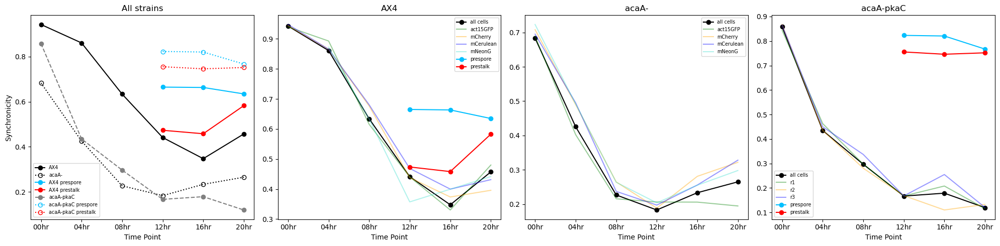

(<Figure size 2000x500 with 4 Axes>,
 array([<Axes: title={'center': 'All strains'}, xlabel='Time Point', ylabel='Synchronicity'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-pkaC'}, xlabel='Time Point'>],
       dtype=object))

In [ ]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_pca",
    similarity_func=average_pairwise_cosine_similarity,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
)

# PCA on concat data, cosine distances, preprocessing (normalize, log1p), 50 components

In [16]:
from sklearn.preprocessing import normalize

adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read(filename=f"../data/processed/acaA_pkaC.h5ad")

# np.random.seed(42)
# idx = np.random.choice(adata_acaA_pkaC_all.X.shape[0], size=int(adata_acaA_pkaC_all.X.shape[0] * 0.1), replace=False)
# adata_acaA_pkaC_all = adata_acaA_pkaC_all[idx].copy()

adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
adata_all_strains.obs["sample"] = (
    adata_all_strains.obs["strain"].astype(str)
    + "_"
    + adata_all_strains.obs["time"].astype(str)
)

sc.pp.normalize_total(adata_all_strains, target_sum=1e4)
sc.pp.log1p(adata_all_strains)

sc.tl.pca(adata_all_strains)
adata_all_strains.obsm["X_pca"] = normalize(adata_all_strains.obsm["X_pca"], norm='l2')

adata_all = adata_all_strains[adata_all_strains.obs["strain"] == "AX4"]
adata_acaA_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA"]
adata_acaA_pkaC_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA_pkaC"]

for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all[adata_acaA_pkaC_all.obs["time"] == tp]

/var/folders/b0/d34rvffj6l18k2sl5mb16w440000gn/T/ipykernel_26993/3149960328.py:14: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:206: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")


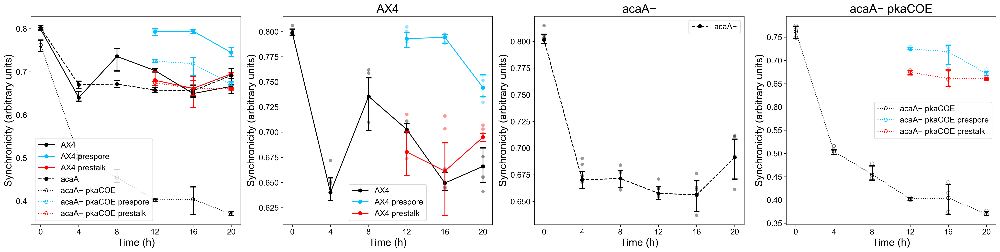

(<Figure size 6115.5x1564.25 with 4 Axes>,
 array([<Axes: xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA−'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA− pkaCOE'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>],
       dtype=object))

In [17]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_pca",
    similarity_func=average_pairwise_euclidean_similarity,
)
CI_dict = compute_confidence_intervals(
    results_pca['mean_distances'], 
    time_points,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
    CI_dict=CI_dict,
    save_path="../results/figures/synchronicity/PCA_all_error.pdf",
)

In [18]:
from scipy.stats import ttest_ind, mannwhitneyu
p_values_dict = {}
strains = ["AX4", "acaA", "acaA_pkaC"]
for h in range(3):
    if strains[h] not in p_values_dict:
        p_values_dict[strains[h]] = {}
    for j in range(h, 3):
        if strains[j] not in p_values_dict[strains[h]]:
            p_values_dict[strains[h]][strains[j]] = {}
        for k in range(0, len(time_points)):
            if time_points[k] not in p_values_dict[strains[h]][strains[j]]:
                p_values_dict[strains[h]][strains[j]][time_points[k]] = {}
            for l in range(k, len(time_points)):
                # Original groups
                replicates1 = [r for r in results_pca['mean_distances'][strains[h]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group1 = [results_pca['mean_distances'][strains[h]][r][time_points[k]] for r in replicates1]
                replicates2 = [r for r in results_pca['mean_distances'][strains[j]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group2 = [results_pca['mean_distances'][strains[j]][r][time_points[l]] for r in replicates2]
                t_stat, p_val_ttest = ttest_ind(group1, group2, equal_var=True)
                p_values_dict[strains[h]][strains[j]][time_points[k]][time_points[l]] = p_val_ttest
                print(f"{strains[h]} vs {strains[j]} at {time_points[k]} vs {time_points[l]}: {p_val_ttest:.10f}")
            print()

AX4 vs AX4 at 00hr vs 00hr: 1.0000000000
AX4 vs AX4 at 00hr vs 04hr: 0.0000439814
AX4 vs AX4 at 00hr vs 08hr: 0.0260599198
AX4 vs AX4 at 00hr vs 12hr: 0.0000097120
AX4 vs AX4 at 00hr vs 16hr: 0.0000127974
AX4 vs AX4 at 00hr vs 20hr: 0.0001456248

AX4 vs AX4 at 04hr vs 04hr: 1.0000000000
AX4 vs AX4 at 04hr vs 08hr: 0.0093116306
AX4 vs AX4 at 04hr vs 12hr: 0.0035985692
AX4 vs AX4 at 04hr vs 16hr: 0.6753308909
AX4 vs AX4 at 04hr vs 20hr: 0.9887028639

AX4 vs AX4 at 08hr vs 08hr: 1.0000000000
AX4 vs AX4 at 08hr vs 12hr: 0.0893416310
AX4 vs AX4 at 08hr vs 16hr: 0.0069166010
AX4 vs AX4 at 08hr vs 20hr: 0.0117770131

AX4 vs AX4 at 12hr vs 12hr: 1.0000000000
AX4 vs AX4 at 12hr vs 16hr: 0.0010125063
AX4 vs AX4 at 12hr vs 20hr: 0.0101129268

AX4 vs AX4 at 16hr vs 16hr: 1.0000000000
AX4 vs AX4 at 16hr vs 20hr: 0.7261870255

AX4 vs AX4 at 20hr vs 20hr: 1.0000000000

AX4 vs acaA at 00hr vs 00hr: 0.2680266247
AX4 vs acaA at 00hr vs 04hr: 0.0000059349
AX4 vs acaA at 00hr vs 08hr: 0.0000041868
AX4 vs 

In [19]:
# Create a multi-index DataFrame structure
index = pd.MultiIndex.from_product([strains, time_points], names=["Strain", "Time"])
columns = pd.MultiIndex.from_product([strains, time_points], names=["Comparison Strain", "Comparison Time"])

# Initialize an empty DataFrame
p_values_df = pd.DataFrame(index=index, columns=columns)

# Fill the DataFrame with p-values
for strain_1 in strains:
    for strain_2 in strains:
        for time_point1 in time_points:
            for time_point2 in time_points:
                p_value = p_values_dict.get(strain_1, {}).get(strain_2, {}).get(time_point1, {}).get(time_point2, np.nan)
                if p_value == 0:
                    formatted_p_value = "0.00"
                elif p_value < 0.01:
                    formatted_p_value = f"{p_value:.2e}"
                else:
                    formatted_p_value = f"{p_value:.2f}"
                p_values_df.loc[(strain_1, time_point1), (strain_2, time_point2)] = formatted_p_value

# Display the formatted DataFrame

In [20]:
p_values_df

Comparison Strain   AX4                                                    \
Comparison Time    00hr      04hr      08hr      12hr      16hr      20hr   
Strain    Time                                                              
AX4       00hr     1.00  4.40e-05      0.03  9.71e-06  1.28e-05  1.46e-04   
          04hr      nan      1.00  9.31e-03  3.60e-03      0.68      0.99   
          08hr      nan       nan      1.00      0.09  6.92e-03      0.01   
          12hr      nan       nan       nan      1.00  1.01e-03      0.01   
          16hr      nan       nan       nan       nan      1.00      0.73   
          20hr      nan       nan       nan       nan       nan      1.00   
acaA      00hr      nan       nan       nan       nan       nan       nan   
          04hr      nan       nan       nan       nan       nan       nan   
          08hr      nan       nan       nan       nan       nan       nan   
          12hr      nan       nan       nan       nan       nan       nan   
          16hr      nan       nan       nan       nan       nan       nan   
          20hr      nan       nan       nan       nan       nan       nan   
acaA_pkaC 00hr      nan       nan       nan       nan       nan       nan   
          04hr      nan       nan       nan       nan       nan       nan   
          08hr      nan       nan       nan       nan       nan       nan   
          12hr      nan       nan       nan       nan       nan       nan   
          16hr      nan       nan       nan       nan       nan       nan   
          20hr      nan       nan       nan       nan       nan       nan   

Comparison Strain  acaA                                                    \
Comparison Time    00hr      04hr      08hr      12hr      16hr      20hr   
Strain    Time                                                              
AX4       00hr     0.27  5.93e-06  4.19e-06  4.70e-07  2.78e-05  5.86e-04   
          04hr      nan      0.05      0.12      0.50      0.86      0.06   
          08hr      nan       nan  5.81e-03  2.62e-03  4.39e-03      0.05   
          12hr      nan       nan       nan  2.32e-04  5.77e-03      0.46   
          16hr      nan       nan       nan       nan      0.58      0.04   
          20hr      nan       nan       nan       nan       nan      0.07   
acaA      00hr     1.00  5.61e-07  3.82e-07  4.82e-08  2.63e-06  8.67e-05   
          04hr      nan      1.00      0.42      0.03      0.08      0.29   
          08hr      nan       nan      1.00      0.12      0.19      0.15   
          12hr      nan       nan       nan      1.00      0.73      0.04   
          16hr      nan       nan       nan       nan      1.00      0.05   
          20hr      nan       nan       nan       nan       nan      1.00   
acaA_pkaC 00hr      nan       nan       nan       nan       nan       nan   
          04hr      nan       nan       nan       nan       nan       nan   
          08hr      nan       nan       nan       nan       nan       nan   
          12hr      nan       nan       nan       nan       nan       nan   
          16hr      nan       nan       nan       nan       nan       nan   
          20hr      nan       nan       nan       nan       nan       nan   

Comparison Strain acaA_pkaC                                                    
Comparison Time        00hr      04hr      08hr      12hr      16hr      20hr  
Strain    Time                                                                 
AX4       00hr     7.79e-03  1.62e-07  3.68e-06  8.62e-09  3.09e-05  2.15e-08  
          04hr          nan  5.48e-05  7.80e-05  4.47e-06  2.46e-04  3.36e-06  
          08hr          nan       nan  1.25e-04  3.59e-05  1.85e-04  2.63e-05  
          12hr          nan       nan       nan  8.02e-08  9.69e-05  1.18e-07  
          16hr          nan       nan       nan       nan  2.32e-04  1.26e-06  
          20hr          nan       nan       nan       nan       nan  1.05e-05  
acaA      00hr     1.78e-03  1.19e-08  1.70e

In [21]:
from scipy.stats import ttest_ind, mannwhitneyu
p_values_dict = {}
strains = ["AX4", "AX4_psp", "AX4_pst"]
for h in range(len(strains)):
    if strains[h] not in p_values_dict:
        p_values_dict[strains[h]] = {}
    for j in range(h, len(strains)):
        if strains[j] not in p_values_dict[strains[h]]:
            p_values_dict[strains[h]][strains[j]] = {}
        for k in range(3, len(time_points)):
            if time_points[k] not in p_values_dict[strains[h]][strains[j]]:
                p_values_dict[strains[h]][strains[j]][time_points[k]] = {}
            for l in range(k, len(time_points)):
                # Original groups
                replicates1 = [r for r in results_pca['mean_distances'][strains[h]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group1 = [results_pca['mean_distances'][strains[h]][r][time_points[k]] for r in replicates1]
                replicates2 = [r for r in results_pca['mean_distances'][strains[j]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group2 = [results_pca['mean_distances'][strains[j]][r][time_points[l]] for r in replicates2]
                t_stat, p_val_ttest = ttest_ind(group1, group2, equal_var=True)
                p_values_dict[strains[h]][strains[j]][time_points[k]][time_points[l]] = p_val_ttest
                print(f"{strains[h]} vs {strains[j]} at {time_points[k]} vs {time_points[l]}: {p_val_ttest:.10f}")
            print()

AX4 vs AX4 at 12hr vs 12hr: 1.0000000000
AX4 vs AX4 at 12hr vs 16hr: 0.0010125063
AX4 vs AX4 at 12hr vs 20hr: 0.0101129268

AX4 vs AX4 at 16hr vs 16hr: 1.0000000000
AX4 vs AX4 at 16hr vs 20hr: 0.7261870255

AX4 vs AX4 at 20hr vs 20hr: 1.0000000000

AX4 vs AX4_psp at 12hr vs 12hr: 0.0000648993
AX4 vs AX4_psp at 12hr vs 16hr: 0.0000252347
AX4 vs AX4_psp at 12hr vs 20hr: 0.0093183656

AX4 vs AX4_psp at 16hr vs 16hr: 0.0000203499
AX4 vs AX4_psp at 16hr vs 20hr: 0.0005311866

AX4 vs AX4_psp at 20hr vs 20hr: 0.0024460774

AX4 vs AX4_pst at 12hr vs 12hr: 0.5570922416
AX4 vs AX4_pst at 12hr vs 16hr: 0.4767148337
AX4 vs AX4_pst at 12hr vs 20hr: 0.5521921244

AX4 vs AX4_pst at 16hr vs 16hr: 0.2033241877
AX4 vs AX4_pst at 16hr vs 20hr: 0.0010593097

AX4 vs AX4_pst at 20hr vs 20hr: 0.0116050739

AX4_psp vs AX4_psp at 12hr vs 12hr: 1.0000000000
AX4_psp vs AX4_psp at 12hr vs 16hr: 0.5118645609
AX4_psp vs AX4_psp at 12hr vs 20hr: 0.0017190060

AX4_psp vs AX4_psp at 16hr vs 16hr: 1.0000000000
AX4_psp 

In [22]:
# Create a multi-index DataFrame structure
index = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Strain", "Time"])
columns = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Comparison Strain", "Comparison Time"])

# Initialize an empty DataFrame
p_values_df = pd.DataFrame(index=index, columns=columns)

# Fill the DataFrame with p-values
for strain_1 in strains:
    for strain_2 in strains:
        for time_point1 in time_points[3:]:
            for time_point2 in time_points[3:]:
                p_value = p_values_dict.get(strain_1, {}).get(strain_2, {}).get(time_point1, {}).get(time_point2, np.nan)
                if p_value == 0:
                    formatted_p_value = "0.00"
                elif p_value < 0.01:
                    formatted_p_value = f"{p_value:.2e}"
                else:
                    formatted_p_value = f"{p_value:.2f}"
                p_values_df.loc[(strain_1, time_point1), (strain_2, time_point2)] = formatted_p_value

# Display the formatted DataFrame

In [23]:
p_values_df

Comparison Strain   AX4                   AX4_psp                      \
Comparison Time    12hr      16hr  20hr      12hr      16hr      20hr   
Strain  Time                                                            
AX4     12hr       1.00  1.01e-03  0.01  6.49e-05  2.52e-05  9.32e-03   
        16hr        nan      1.00  0.73       nan  2.03e-05  5.31e-04   
        20hr        nan       nan  1.00       nan       nan  2.45e-03   
AX4_psp 12hr        nan       nan   nan      1.00      0.51  1.72e-03   
        16hr        nan       nan   nan       nan      1.00  1.47e-03   
        20hr        nan       nan   nan       nan       nan      1.00   
AX4_pst 12hr        nan       nan   nan       nan       nan       nan   
        16hr        nan       nan   nan       nan       nan       nan   
        20hr        nan       nan   nan       nan       nan       nan   

Comparison Strain   AX4_pst                      
Comparison Time        12hr      16hr      20hr  
Strain  Time                                     
AX4     12hr           0.56      0.48      0.55  
        16hr            nan      0.20  1.06e-03  
        20hr            nan       nan      0.01  
AX4_psp 12hr       1.70e-03  8.23e-03  4.87e-05  
        16hr            nan  8.93e-03  1.62e-05  
        20hr            nan       nan  6.66e-03  
AX4_pst 12hr           1.00      0.74      0.67  
        16hr            nan      1.00      0.53  
        20hr            nan       nan      1.00

In [24]:
from scipy.stats import ttest_ind, mannwhitneyu
p_values_dict = {}
strains = ["acaA_pkaC", "acaA_pkaC_psp", "acaA_pkaC_pst"]
for h in range(len(strains)):
    if strains[h] not in p_values_dict:
        p_values_dict[strains[h]] = {}
    for j in range(h, len(strains)):
        if strains[j] not in p_values_dict[strains[h]]:
            p_values_dict[strains[h]][strains[j]] = {}
        for k in range(3, len(time_points)):
            if time_points[k] not in p_values_dict[strains[h]][strains[j]]:
                p_values_dict[strains[h]][strains[j]][time_points[k]] = {}
            for l in range(k, len(time_points)):
                # Original groups
                replicates1 = [r for r in results_pca['mean_distances'][strains[h]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group1 = [results_pca['mean_distances'][strains[h]][r][time_points[k]] for r in replicates1]
                replicates2 = [r for r in results_pca['mean_distances'][strains[j]] if r not in ["all", "00hr", "04hr", "08hr", "12hr", "16hr", "20hr"]]
                group2 = [results_pca['mean_distances'][strains[j]][r][time_points[l]] for r in replicates2]
                t_stat, p_val_ttest = ttest_ind(group1, group2, equal_var=True)
                p_values_dict[strains[h]][strains[j]][time_points[k]][time_points[l]] = p_val_ttest
                print(f"{strains[h]} vs {strains[j]} at {time_points[k]} vs {time_points[l]}: {p_val_ttest:.10f}")
            print()

acaA_pkaC vs acaA_pkaC at 12hr vs 12hr: 1.0000000000
acaA_pkaC vs acaA_pkaC at 12hr vs 16hr: 0.7531571239
acaA_pkaC vs acaA_pkaC at 12hr vs 20hr: 0.0005740046

acaA_pkaC vs acaA_pkaC at 16hr vs 16hr: 1.0000000000
acaA_pkaC vs acaA_pkaC at 16hr vs 20hr: 0.1190871593

acaA_pkaC vs acaA_pkaC at 20hr vs 20hr: 1.0000000000

acaA_pkaC vs acaA_pkaC_psp at 12hr vs 12hr: 0.0000000133
acaA_pkaC vs acaA_pkaC_psp at 12hr vs 16hr: 0.0000235018
acaA_pkaC vs acaA_pkaC_psp at 12hr vs 20hr: 0.0000001077

acaA_pkaC vs acaA_pkaC_psp at 16hr vs 16hr: 0.0001922481
acaA_pkaC vs acaA_pkaC_psp at 16hr vs 20hr: 0.0001472596

acaA_pkaC vs acaA_pkaC_psp at 20hr vs 20hr: 0.0000001591

acaA_pkaC vs acaA_pkaC_pst at 12hr vs 12hr: 0.0000001151
acaA_pkaC vs acaA_pkaC_pst at 12hr vs 16hr: 0.0000151590
acaA_pkaC vs acaA_pkaC_pst at 12hr vs 20hr: 0.0000000197

acaA_pkaC vs acaA_pkaC_pst at 16hr vs 16hr: 0.0002946776
acaA_pkaC vs acaA_pkaC_pst at 16hr vs 20hr: 0.0001714390

acaA_pkaC vs acaA_pkaC_pst at 20hr vs 20hr: 0.0

In [25]:
# Create a multi-index DataFrame structure
index = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Strain", "Time"])
columns = pd.MultiIndex.from_product([strains, time_points[3:]], names=["Comparison Strain", "Comparison Time"])

# Initialize an empty DataFrame
p_values_df = pd.DataFrame(index=index, columns=columns)

# Fill the DataFrame with p-values
for strain_1 in strains:
    for strain_2 in strains:
        for time_point1 in time_points[3:]:
            for time_point2 in time_points[3:]:
                p_value = p_values_dict.get(strain_1, {}).get(strain_2, {}).get(time_point1, {}).get(time_point2, np.nan)
                if p_value == 0:
                    formatted_p_value = "0.00"
                elif p_value < 0.01:
                    formatted_p_value = f"{p_value:.2e}"
                else:
                    formatted_p_value = f"{p_value:.2f}"
                p_values_df.loc[(strain_1, time_point1), (strain_2, time_point2)] = formatted_p_value

# Display the formatted DataFrame

In [26]:
p_values_df

Comparison Strain  acaA_pkaC                 acaA_pkaC_psp            \
Comparison Time         12hr  16hr      20hr          12hr      16hr   
Strain        Time                                                     
acaA_pkaC     12hr      1.00  0.75  5.74e-04      1.33e-08  2.35e-05   
              16hr       nan  1.00      0.12           nan  1.92e-04   
              20hr       nan   nan      1.00           nan       nan   
acaA_pkaC_psp 12hr       nan   nan       nan          1.00      0.52   
              16hr       nan   nan       nan           nan      1.00   
              20hr       nan   nan       nan           nan       nan   
acaA_pkaC_pst 12hr       nan   nan       nan           nan       nan   
              16hr       nan   nan       nan           nan       nan   
              20hr       nan   nan       nan           nan       nan   

Comparison Strain            acaA_pkaC_pst                      
Comparison Time         20hr          12hr      16hr      20hr  
Strain        Time                                              
acaA_pkaC     12hr  1.08e-07      1.15e-07  1.52e-05  1.97e-08  
              16hr  1.47e-04           nan  2.95e-04  1.71e-04  
              20hr  1.59e-07           nan       nan  6.66e-08  
acaA_pkaC_psp 12hr  9.49e-05      1.05e-04  3.20e-03  6.58e-06  
              16hr      0.05           nan      0.03      0.02  
              20hr      1.00           nan       nan      0.02  
acaA_pkaC_pst 12hr       nan          1.00      0.22      0.01  
              16hr       nan           nan      1.00      0.81  
              20hr       nan           nan       nan      1.00

In [6]:
dfs = export_synchronicity_data(
    results_pca,
    CI_dict=CI_dict,
    save_path="../results/pca_synchronicity_source_data.xlsx"
)

Data exported to ../results/pca_synchronicity_source_data.xlsx
Sheets: ['synchronicity', 'synchronicity_confidence_intervals']


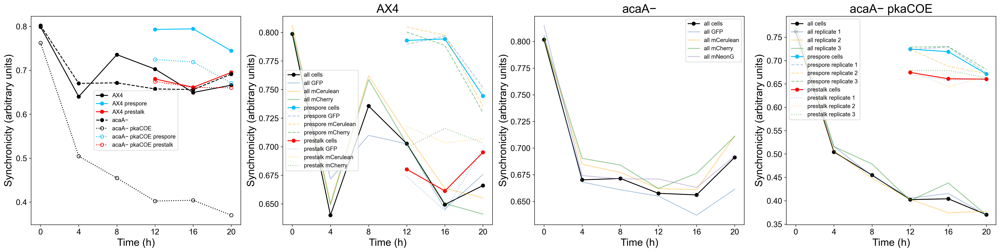

(<Figure size 6115.5x1564.25 with 4 Axes>,
 array([<Axes: xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA−'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>,
        <Axes: title={'center': 'acaA− pkaCOE'}, xlabel='Time (h)', ylabel='Synchronicity (arbitrary units)'>],
       dtype=object))

In [7]:
plot_synchronicity_row(
    results_pca['mean_distances'],
    save_path="../results/figures/synchronicity/PCA_all.pdf",
)

# PCA on concat data, cosine distances, preprocessing (top 2000 HVGs), 50 components

In [ ]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read(filename=f"../data/processed/acaA_pkaC.h5ad")

np.random.seed(42)
idx = np.random.choice(adata_acaA_pkaC_all.X.shape[0], size=int(adata_acaA_pkaC_all.X.shape[0] * 0.1), replace=False)
adata_acaA_pkaC_all = adata_acaA_pkaC_all[idx].copy()

adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
adata_all_strains.obs["sample"] = (
    adata_all_strains.obs["strain"].astype(str)
    + "_"
    + adata_all_strains.obs["time"].astype(str)
)

sc.pp.normalize_total(adata_all_strains, target_sum=1e4)
sc.pp.log1p(adata_all_strains)

sc.pp.highly_variable_genes(
    adata_all_strains,
    batch_key="sample",   # very common choice here
    flavor="seurat_v3",
    n_top_genes=2000
)

adata_all_strains_hvg = adata_all_strains[:, adata_all_strains.var["highly_variable"]].copy()

sc.pp.scale(adata_all_strains_hvg, max_value=10)

sc.tl.pca(adata_all_strains_hvg)

adata_all_strains.obsm["X_pca"] = adata_all_strains_hvg.obsm["X_pca"]

adata_all = adata_all_strains[adata_all_strains.obs["strain"] == "AX4"]
adata_acaA_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA"]
adata_acaA_pkaC_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA_pkaC"]

for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all[adata_acaA_pkaC_all.obs["time"] == tp]

/var/folders/b0/d34rvffj6l18k2sl5mb16w440000gn/T/ipykernel_77351/3720726656.py:12: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:206: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")


{'all': {'12hr': 0.8192264586687088, '16hr': 0.8030869513750076, '20hr': 0.7196400165557861}, 'act15GFP': {'12hr': 0.8155219703912735, '16hr': 0.8078979998826981, '20hr': 0.7321314215660095}, 'mCherry': {'12hr': 0.8263907879590988, '16hr': 0.7925689518451691, '20hr': 0.6978833675384521}, 'mCerulean': {'12hr': 0.8335060030221939, '16hr': 0.8084858655929565, '20hr': 0.7060985267162323}}


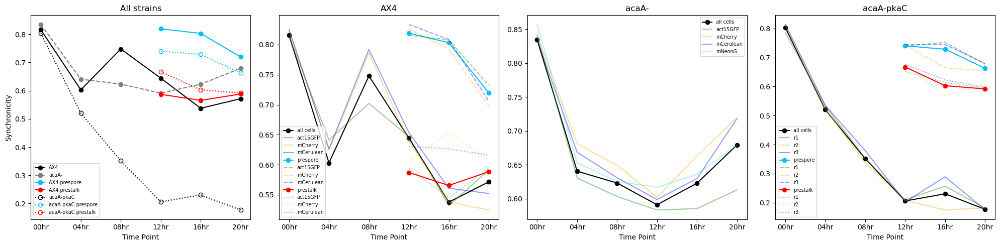

(<Figure size 2000x500 with 4 Axes>,
 array([<Axes: title={'center': 'All strains'}, xlabel='Time Point', ylabel='Synchronicity'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-pkaC'}, xlabel='Time Point'>],
       dtype=object))

In [ ]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_pca",
    similarity_func=average_pairwise_cosine_similarity,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
)

# PCA on concat data, cosine distances, preprocessing (top 2000 HVGs), 100 components

In [ ]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read(filename=f"../data/processed/acaA_pkaC.h5ad")

np.random.seed(42)
idx = np.random.choice(adata_acaA_pkaC_all.X.shape[0], size=int(adata_acaA_pkaC_all.X.shape[0] * 0.1), replace=False)
adata_acaA_pkaC_all = adata_acaA_pkaC_all[idx].copy()

adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
adata_all_strains.obs["sample"] = (
    adata_all_strains.obs["strain"].astype(str)
    + "_"
    + adata_all_strains.obs["time"].astype(str)
)

sc.pp.normalize_total(adata_all_strains, target_sum=1e4)
sc.pp.log1p(adata_all_strains)

sc.pp.highly_variable_genes(
    adata_all_strains,
    batch_key="sample",   # very common choice here
    flavor="seurat_v3",
    n_top_genes=2000
)

adata_all_strains_hvg = adata_all_strains[:, adata_all_strains.var["highly_variable"]].copy()

sc.pp.scale(adata_all_strains_hvg, max_value=10)

sc.tl.pca(adata_all_strains_hvg, n_comps=100)

adata_all_strains.obsm["X_pca"] = adata_all_strains_hvg.obsm["X_pca"]

adata_all = adata_all_strains[adata_all_strains.obs["strain"] == "AX4"]
adata_acaA_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA"]
adata_acaA_pkaC_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA_pkaC"]

for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all[adata_acaA_pkaC_all.obs["time"] == tp]

/var/folders/b0/d34rvffj6l18k2sl5mb16w440000gn/T/ipykernel_18970/141375040.py:12: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:206: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")


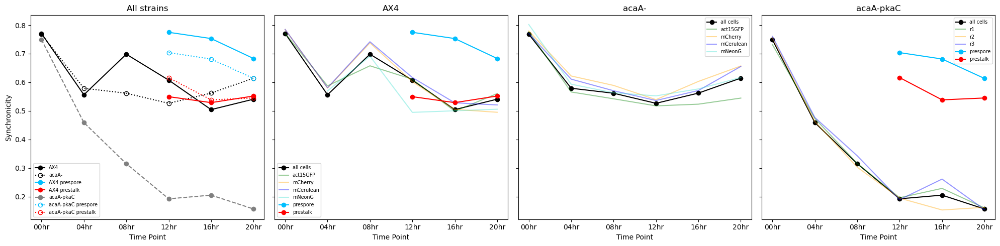

(<Figure size 2000x500 with 4 Axes>,
 array([<Axes: title={'center': 'All strains'}, xlabel='Time Point', ylabel='Synchronicity'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-pkaC'}, xlabel='Time Point'>],
       dtype=object))

In [ ]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_pca",
    similarity_func=average_pairwise_cosine_similarity,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
)

# PCA on concat data, euclidean distances between l2 normalized pca vectors, preprocessing, 50 components

In [ ]:
adatas = {}
adatas_acaA = {}
adatas_acaA_pkaC = {}
adata_all = sc.read(filename=f"../data/processed/AX4.h5ad")
adata_acaA_all = sc.read(filename=f"../data/processed/acaA.h5ad")
adata_acaA_pkaC_all = sc.read(filename=f"../data/processed/acaA_pkaC.h5ad")

np.random.seed(42)
idx = np.random.choice(adata_acaA_pkaC_all.X.shape[0], size=int(adata_acaA_pkaC_all.X.shape[0] * 0.1), replace=False)
adata_acaA_pkaC_all = adata_acaA_pkaC_all[idx].copy()

adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
adata_all_strains.obs["sample"] = (
    adata_all_strains.obs["strain"].astype(str)
    + "_"
    + adata_all_strains.obs["time"].astype(str)
)

sc.pp.normalize_total(adata_all_strains, target_sum=1e4)
sc.pp.log1p(adata_all_strains)

sc.pp.highly_variable_genes(
    adata_all_strains,
    batch_key="sample",   # very common choice here
    flavor="seurat_v3",
    n_top_genes=2000
)

adata_all_strains_hvg = adata_all_strains[:, adata_all_strains.var["highly_variable"]].copy()

sc.pp.scale(adata_all_strains_hvg, max_value=10)

sc.tl.pca(adata_all_strains_hvg)

#L2 normalization of pca
adata_all_strains_hvg.obsm["X_pca"] = adata_all_strains_hvg.obsm["X_pca"] / np.linalg.norm(adata_all_strains_hvg.obsm["X_pca"], axis=1, keepdims=True)

adata_all_strains.obsm["X_pca"] = adata_all_strains_hvg.obsm["X_pca"]

adata_all = adata_all_strains[adata_all_strains.obs["strain"] == "AX4"]
adata_acaA_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA"]
adata_acaA_pkaC_all = adata_all_strains[adata_all_strains.obs["strain"] == "acaA_pkaC"]

for tp in time_points:
    adatas[tp] = adata_all[adata_all.obs["time"] == tp]
    adatas_acaA[tp] = adata_acaA_all[adata_acaA_all.obs["time"] == tp]
    adatas_acaA_pkaC[tp] = adata_acaA_pkaC_all[adata_acaA_pkaC_all.obs["time"] == tp]

/var/folders/b0/d34rvffj6l18k2sl5mb16w440000gn/T/ipykernel_18970/1548150116.py:12: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all_strains = adata_all.concatenate(adata_acaA_all, adata_acaA_pkaC_all)
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/opt/anaconda3/envs/scRNA_env/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:206: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")


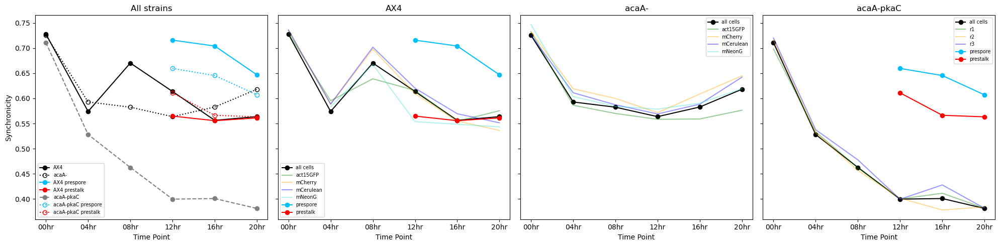

(<Figure size 2000x500 with 4 Axes>,
 array([<Axes: title={'center': 'All strains'}, xlabel='Time Point', ylabel='Synchronicity'>,
        <Axes: title={'center': 'AX4'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-'}, xlabel='Time Point'>,
        <Axes: title={'center': 'acaA-pkaC'}, xlabel='Time Point'>],
       dtype=object))

In [ ]:
results_pca = compute_synchronicity(
    adatas=adatas,
    adatas_acaA=adatas_acaA,
    adatas_acaA_pkaC=adatas_acaA_pkaC,
    time_points=time_points,
    embedding_key="X_pca",
    similarity_func=average_pairwise_euclidean_similarity,
)
plot_synchronicity_row(
    results_pca['mean_distances'],
)